# Selection of BGLT fields using a galaxy catalog

## Load and reduce galaxy catalog

The initial (NED Local Volume Sample) catalog is available at the following url: https://ned.ipac.caltech.edu/NED::gals/

A reduced version for galaxies closer than 150 Mpc, with duplicate entries (within 5 arcsec) removed, is available in this folder: https://drive.google.com/drive/folders/1M0o6B6UKuB0DE3b9mooW9IulC_U0rGev?usp=drive_link

The BG field list, the selection of BGLT fields and the HECATE catalog restricted to galaxies closer than 180 Mpc are available in the same folder.

In [428]:
from astropy.table import Table
import pandas as pd
import json
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord, SkyOffsetFrame
import astropy.units as u
from astropy.wcs import WCS
import json
import requests
from PIL import Image
import urllib
from matplotlib.patches import Circle

use_hecate = 1
accurate_match = 0

datadir = "Downloads/Catalogs/"

In [429]:
lvs = Table.read(datadir+"LVS_150.fits")
gals = Table.read(datadir+"HECATE_180.fits")
gals = gals[gals['D']<150]
gals['RA'].name = 'ra'
gals['DEC'].name = 'dec'
gals['OBJNAME'].name = 'objname'
lvs['logM'] = np.log10(lvs['Mstar'])
lvs['logSFR'] = np.log10(lvs['SFR_hybrid'])
gals['Mstar'] = 10**gals['logM_HEC']
gals['SFR_hybrid'] = 10**gals['logSFR_HEC']

sfr_missing = lvs['SFR_hybrid'].mask
lvs['logSFR'][sfr_missing] = np.log10(lvs['SFR_W4'][sfr_missing])

In [430]:
c1 = SkyCoord(gals['ra'],gals['dec'],frame='icrs',unit='deg')
c2 = SkyCoord(lvs['ra'], lvs['dec'],frame='icrs',unit='deg')

# Match LVS and HECATE
idx,d2d,d3d = c1.match_to_catalog_sky(c2)

# Matching radius = 5 arcsec
ind = d2d.arcsec<5
idxind = idx[ind]

print(np.sum(ind), "HECATE galaxies have a match in LVS")

114193 HECATE galaxies have a match in LVS


* For galaxies with no SFR_hybrid, use SFR_W4
* For galaxies with no SFR or stellar mass, use HECATE values

In [431]:
mstar_missing = gals['Mstar'].mask
print(np.sum(mstar_missing),"HECATE galaxies with no Mstar")

sfr_missing = gals['SFR_hybrid'].mask


sfr_missing = gals['SFR_hybrid'].mask
print(np.sum(sfr_missing),"HECATE galaxies with no SFR")

# For galaxies with no SFR or stellar mass, use LVS values
mstar_missing = np.logical_and(ind, mstar_missing)
sfr_missing = np.logical_and(ind, sfr_missing)

gals['SFR_hybrid'][sfr_missing] = 10**lvs['logSFR'][idx[sfr_missing]]
gals['Mstar'][mstar_missing] = 10*lvs['logM'][idx[mstar_missing]]

print(np.sum(np.logical_and(gals['Mstar']>3e9,gals['SFR_hybrid']/gals['Mstar']>1e-11)),"starforming galaxies")

mstar_missing = gals['Mstar'].mask
sfr_missing = gals['SFR_hybrid'].mask
print(np.sum(mstar_missing),"HECATE galaxies with no Mstar after HECATE completion")
print(np.sum(sfr_missing),"HECATE galaxies with no SFR after HECATE completion")

47550 HECATE galaxies with no Mstar
72532 HECATE galaxies with no SFR
46534 starforming galaxies
16381 HECATE galaxies with no Mstar after HECATE completion
20692 HECATE galaxies with no SFR after HECATE completion


## Keep only galaxies with valid SFR or Mstar and apply cuts

In [432]:
gals = gals[gals['Mstar']>1e4]
gals = gals[gals['SFR_hybrid']>0]
gals['sSFR'] = gals['SFR_hybrid']/gals['Mstar']

print(len(gals),"galaxies in clean sample")

84466 galaxies in clean sample


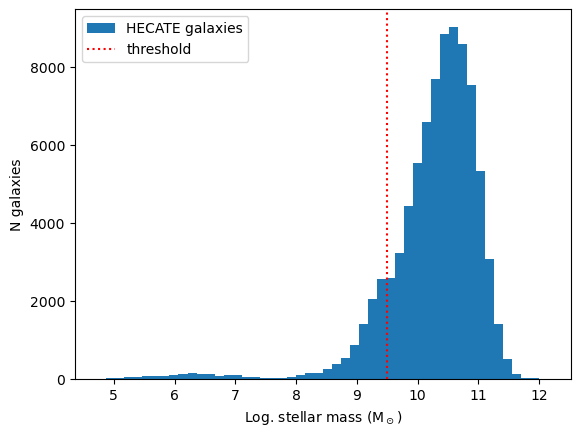

In [433]:
plt.hist(np.log10(gals['Mstar']), bins=50, label='HECATE galaxies')
plt.axvline(9.5, ls=':', color='r', label='threshold')
plt.xlabel("Log. stellar mass (M$_\odot$)")
plt.ylabel("N galaxies")
plt.legend()

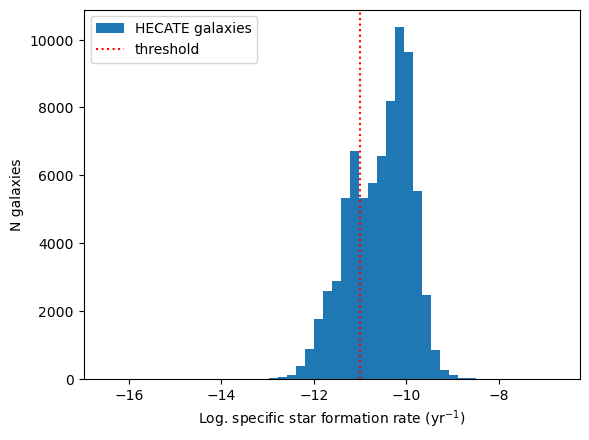

In [434]:
plt.hist(np.log10(gals['sSFR']), bins=50, label='HECATE galaxies')
plt.axvline(-11, ls=':', color='r', label='threshold')
plt.xlabel("Log. specific star formation rate (yr$^{-1}$)")
plt.ylabel("N galaxies")
plt.legend()

In [435]:
# apply cuts

Gals = gals[np.logical_and(gals['sSFR']>1e-11,gals['Mstar']>3e9)]
print(len(Gals),"galaxies in massive starforming sample")

gals = gals[np.logical_and(gals['sSFR']>1e-11,gals['Mstar']>3e9)]
gals.write(datadir+"HECATE_150_starforming.fits", overwrite=True)

print(len(gals),"galaxies in massive starforming sample")

53249 galaxies in massive starforming sample
53249 galaxies in massive starforming sample


## Crossmatch with BlackGEM fields

The following function crossmatch the gals galaxies positions to the coordinates of ML/BG fields.

A JSON file is generated to map each field to the corresponding gals indexes

In [436]:
fields = pd.read_csv(datadir+"MLBG_FieldIDs_Oct2022.csv")
centers = SkyCoord(fields.ra.values*u.deg, fields.dec.values*u.deg, frame="icrs")
centers.transform_to(SkyOffsetFrame(origin=centers))

def coords2field(target, allfield = False):
    '''
    Returns the BlackGEM / MeerLICHT field IDS for a given position.

    Parameters
    ----------
    ra : float
        Right ascension of the position in degrees.
    dec : float
        Declination in degrees
        
    Returns
    -------
    fields : string or DataFrame
        The ID of the field(s) matching coordinates
    allfield: boolean
        Whether you want all fields matching coordinates or just one
    '''
    side = 1.64
    hside = side/2.
    
    
    target_centers = target.transform_to(SkyOffsetFrame(origin=centers))
    xi, eta = target_centers.lon, target_centers.lat

    contains_mask = (np.abs(xi) < hside*u.deg) * (np.abs(eta)< hside*u.deg)
        
    if allfield:
        return fields.iloc[contains_mask]['FieldID']
    else:
        return fields.iloc[contains_mask].iloc[0]['FieldID']


In [437]:
gals = gals[gals['dec']<30]
coo = SkyCoord(gals['ra'], gals['dec'],frame='icrs',unit='deg')

class NpEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NpEncoder, self).default(obj)

if accurate_match:
    # more accurate (complete matching method) but longer
    
    galids = {}
    for i in tqdm(range(len(gals))):
        fieldid_all = coords2field(coo[i],True)
        for j in range(len(fieldid_all)):
            f = int(fieldid_all.iloc[j])
            if f in galids.keys():
                galids[f].append(i)
                # new galaxy for the field, append to list
            else:
                galids[f] = [i]
                # first galaxy for the field, start a list



    with open(datadir+"BGfields.json", "w") as outfile: 
        json.dump(galids, outfile)

else:
    # missing some galaxies in regions with many overlapping fields, but ~6 times quicker
    
    # Best matching field for each galaxy
    idx,d2d,d3d = coo.match_to_catalog_sky(centers)
    circlematch1 = d2d.deg<1.64/2
    circlematch2 = np.logical_and(~circlematch1,d2d.deg<1.64*np.sqrt(2)/2)
    print("Circle and ring matches:", np.sum(circlematch1),np.sum(circlematch2))
    
    galids = {f:[] for f in fields['FieldID']}
    for i in tqdm(np.where(circlematch1)[0]):
        galids[fields.iloc[idx[i]]['FieldID']].append(i)

    # 2nd best match
    idx,d2d,d3d = coo.match_to_catalog_sky(centers, nthneighbor=2)
    circlematch_1 = d2d.deg<1.64/2
    circlematch_2 = np.logical_and(np.logical_and(~circlematch1,~circlematch_1),d2d.deg<1.64*np.sqrt(2)/2)
    print("Circle and ring matches (2nd neighbor):", np.sum(circlematch1),np.sum(circlematch_2))
    
    for i in tqdm(np.where(circlematch_1)[0]):
        galids[fields.iloc[idx[i]]['FieldID']].append(i)


    isquare = np.where(np.logical_or(circlematch2,circlematch_2))[0] # indexes to test against square match
    print("Number of remaining galaxies: %d/%d"%(len(isquare),len(gals)))

    for i in tqdm(isquare):
        fieldid_all = coords2field(coo[i],True)
        for j in range(len(fieldid_all)):
            f = fieldid_all.iloc[j]
            galids[f].append(i)

    galids={k:v for (k,v) in galids.items() if len(v)>0}

    with open(datadir+"BGfields.json", "w") as outfile: 
        json.dump(galids, outfile, cls=NpEncoder)

Circle and ring matches: 34646 6189


100%|██████████████████████████████████████████████████████████████████████████| 34646/34646 [00:04<00:00, 7149.48it/s]


Circle and ring matches (2nd neighbor): 34646 6154


100%|████████████████████████████████████████████████████████████████████████████| 1156/1156 [00:00<00:00, 6987.09it/s]


Number of remaining galaxies: 6189/40835


100%|██████████████████████████████████████████████████████████████████████████████| 6189/6189 [02:37<00:00, 39.22it/s]


In [438]:

# Rough match to get total stellar mass - speeds up computation (due to large catalog)
gals_all = Table.read(datadir+"HECATE_180.fits")
gals_all = gals_all[gals_all['D']<150]
gals_all['RA'].name = 'ra'
gals_all['DEC'].name = 'dec'
gals_all['Mstar'] = 10**gals_all['logM_HEC']
gals_all['sSFR'] = 10**np.asarray(gals_all['logSFR_HEC'])/gals_all['Mstar']

c1 = SkyCoord(gals_all['ra'],gals_all['dec'],frame='icrs',unit='deg')

# Match gals and BG fields
idx,d2d,d3d = c1.match_to_catalog_sky(centers)
sep_constraint = d2d.deg<1.64/2
print("matched gals and BG fields")
fields['mtot_all'] = np.zeros(len(fields))
for i in tqdm(np.where(sep_constraint)[0]):
    fields['mtot_all'][idx[i]] += np.nansum([gals_all[i]['Mstar']])


matched gals and BG fields


  0%|                                                                                       | 0/110114 [00:00<?, ?it/s]C:\Users\hgtra\anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:96: UserWarning: Warning: converting a masked element to nan.
  a = np.asanyarray(a)
C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\938369846.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fields['mtot_all'][idx[i]] += np.nansum([gals_all[i]['Mstar']])
100%|████████████████████████████████████████████████████████████████████████| 110114/110114 [00:53<00:00, 2039.50it/s]


In [439]:

# Rough match to get total stellar mass - speed up computation (due to large catalog)
#ztf = Table.read(datadir+"ZTF_BTS_18062024.csv")
#cztf = SkyCoord(ztf['RA'],ztf['Dec'],frame='icrs',unit=[u.hourangle,u.deg])

# Match ZTF and BG fields
#idx,d2d,d3d = cztf.match_to_catalog_sky(centers)
#sep_constraint = d2d.deg<1.64/2
#print("matched ZTF and BG fields")
#fields['nztf'] = np.zeros(len(fields)).astype(int)
#for i in tqdm(np.where(sep_constraint)[0]):
#    fields['nztf'][idx[i]] += 1

# Rough match to get total stellar mass - speed up computation (due to large catalog)
tns = Table.read(datadir+"tns_public_objects_until_20240528.csv")
tns = tns[np.logical_and(tns['reporting_group']!="GaiaAlerts",tns['discoverymag']<19.5)]
tns = tns[tns['name_prefix']!="FRB"]

# Keep transients matching galaxies (here, their 2*D_25 ellipse, where R1=D_25/2 in arcmin) in our HECATE sample


ctns = SkyCoord(tns['ra'],tns['declination'],frame='icrs',unit='deg')
coog = SkyCoord(Gals['ra'],Gals['dec'],frame='icrs',unit='deg')
idx, d2d, d3d = ctns.match_to_catalog_sky(coog)
posang = ctns.position_angle(coog[idx]).deg-Gals[idx]['PA']
posmatch = (d2d.arcmin < 2*Gals[idx]['R1']*Gals[idx]['R2']/np.sqrt(Gals[idx]['R1']**2*np.sin(posang*np.pi/180)**2+Gals[idx]['R2']**2*np.cos(posang*np.pi/180)**2))
tns = tns[posmatch]
ctns = ctns[posmatch]
print("TNS sample length:",len(tns))
# next step: simulate a rather uniform declination coverage
# 4th order polynomial, fitting the density of declination in TNS
#coefficients = [-1.6, 1.2, -0.4, 0.4, 2.3]
coefficients = [2.4,-4,-2.6,3,2.4]
polynomial = np.poly1d(coefficients)

def weigh_dec(dec):
    return 1/polynomial(np.sin(np.maximum(-30,dec)*np.pi/180))

# Match TNS and BG fields
idx,d2d,d3d = ctns.match_to_catalog_sky(centers)
sep_constraint = d2d.deg<1.64/2
print("matched TNS and BG fields")
fields['ntns'] = np.zeros(len(fields)).astype(int)
for i in tqdm(np.where(sep_constraint)[0]):
    if fields['FieldID'][idx[i]]==9175:
        print(i, tns[i]['name'])
    fields['ntns'][idx[i]] += weigh_dec(fields['dec'][idx[i]])

    
    
with open(datadir+'BGfields.json') as json_file:
    galids = json.load(json_file)

ngal =  np.zeros(len(fields)).astype(int) # number of starforming massive gals galaxies per field
mstar = np.zeros(len(fields)) # stellar mass from starforming massive gals galaxies
sfrs =  np.zeros(len(fields)) # star formation rate from starforming massive gals galaxies
lum = np.zeros(len(fields)) # apparent luminosity
    
for i in tqdm(range(len(mstar))):
    f = str(fields['FieldID'][i])
    if f in galids.keys():
        mstar[i] = np.nansum(gals['Mstar'][galids[f],])
        sfrs[i] = np.nansum(gals['SFR_hybrid'][galids[f],])
        lum[i] = np.nansum(10**(-gals['BT'][galids[f],]/2.5))
        
        ngal[i] = len(galids[f])
        
fields['mtot'] = mstar
fields['sfrtot'] = sfrs
fields['ngal'] = ngal
fields['lum'] = lum

bglt_orig = pd.read_csv(datadir+"BGLT2_FieldIDs.dat") # original BGLT fields
i_orig = np.isin(fields['FieldID'],bglt_orig['col1'])
fields['BGLT_orig'] =  i_orig

TNS sample length: 3441
matched TNS and BG fields


  0%|                                                                                         | 0/2829 [00:00<?, ?it/s]C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\3063129507.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fields['ntns'][idx[i]] += weigh_dec(fields['dec'][idx[i]])
  0%|                                                                                        | 0/16080 [00:00<?, ?it/s]C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\3063129507.py:63: UserWarning: Warning: converting a masked element to nan.
  lum[i] = np.nansum(10**(-gals['BT'][galids[f],]/2.5))
C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\3063129507.py:62: UserWarning: Warning: converting a masked element to nan.
  sfrs[i] = np.nansum(gals['SFR_hybrid'][galids[f],])
100%|██████████████████████████████████████

Number of transients in declination-corrected sample: 1835


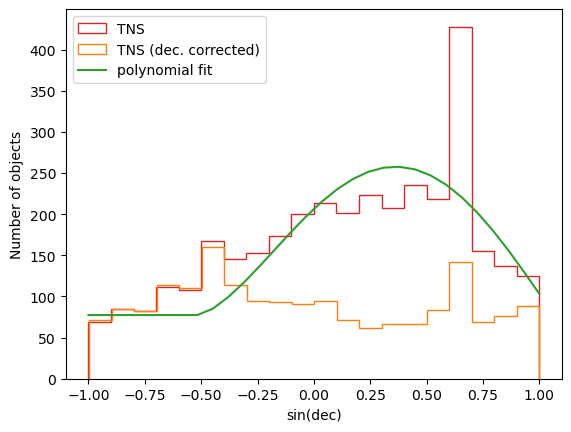

In [440]:
x = np.linspace(-1, 1, 30)
x_deg = np.arcsin(x)*180/np.pi
y = 1/weigh_dec(x_deg)*len(tns)/40


#plt.hist(np.sin(cztf.icrs.dec.deg*np.pi/180),label="ZTF BTS",bins=20)

h = plt.hist(np.sin(tns['declination']*np.pi/180),label="TNS",histtype='step',color='C3',bins=np.linspace(-1,1,21))
print(h)
i_new = np.random.random(len(tns))<weigh_dec(tns['declination'])
print("Number of transients in declination-corrected sample:", np.sum(i_new))
plt.hist(np.sin(tns[i_new]['declination']*np.pi/180),label="TNS (dec. corrected)",histtype='step',color='C1',bins=20)

plt.plot(x,y,label='polynomial fit',color='C2')

plt.xlabel("sin(dec)")
plt.ylabel("Number of objects")
plt.legend()

In [441]:
#Southern sky
isouth = fields['dec']<30
fields_south = fields.loc[isouth]

sfrs = sfrs[isouth]
mstar = mstar[isouth]
i_orig = i_orig[isouth]
ngal = ngal[isouth]

## Define thresholds to select BGLT fields

In [442]:
# Define threshold
nfields = 170
property1 = "ntns"
fields_south[property1][np.isnan(np.asarray(fields_south[property1]))] = 0
property2 = "mtot" # if property1 is discrete, use property2 to keep the nfields maximizing both property1 and property2
threshold1 = fields_south[property1].iloc[np.argsort(np.asarray(fields_south[property1]))[-nfields]]
print("Threshold on %s: %.3e"%(property1, threshold1))

ind = fields_south[property1]>=threshold1
print(np.sum(ind))
if np.sum(ind)>nfields:
    ind = np.logical_and(ind, ~np.isnan(np.asarray(fields_south[property2])))
    print("Adding threshold on %s"%property2)
    threshold2 = fields_south.loc[ind][property2].iloc[np.argsort(np.asarray(fields_south.loc[ind][property2]))[-nfields]]
    print("Threshold on %s: %.3e"%(property2, threshold2))
    ind = np.logical_and(fields_south[property1]>=threshold1, fields_south[property2]>=threshold2)

fields_south.loc[:,'selected'] = ind

print(np.sum(ind), "fields are selected ")


fields_south.to_csv(datadir+"BGLT_fields_selected_0624.csv")

Threshold on ntns: 1.111e+00
431
Adding threshold on mtot
Threshold on mtot: 2.747e+11
170 fields are selected 


C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\817877487.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fields_south[property1][np.isnan(np.asarray(fields_south[property1]))] = 0
C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\817877487.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fields_south.loc[:,'selected'] = ind


In [443]:
frac = np.sum(fields_south[property1].loc[ind])/np.sum(fields_south[property1])
print("selection covers %.2f percents of local %s"%((frac*100),property1))

frac = np.sum(fields_south['ntns'].loc[ind])/np.sum(fields_south['ntns'])
print("selection covers %.2f percents of local number of transients"%((frac*100)))

frac = np.sum(fields_south['ntns'].loc[fields_south['BGLT_orig']])/np.sum(fields_south['ntns'])
print("Paul's selection covers %.2f percents of local number of transients"%((frac*100)))

selection covers 20.65 percents of local ntns
selection covers 20.65 percents of local number of transients
Paul's selection covers 5.46 percents of local number of transients


In [444]:
fields_south.loc[fields_south['BGLT_orig']].iloc[fields_south['ntns'].loc[fields_south['BGLT_orig']].argmax()]
                                                        

FieldID               16011
ra                200.81505
dec               -43.23431
mtot_all     533923530752.0
ntns               4.444444
mtot         297374187520.0
sfrtot             5.395735
ngal                      8
lum                 0.00077
BGLT_orig              True
selected               True
Name: 15957, dtype: object

In [445]:
fields_south.loc[ind].iloc[np.argsort(np.asarray(fields_south[property1].loc[ind]))[-10:]]
                                                        

,FieldID,ra,dec,mtot_all,ntns,mtot,sfrtot,ngal,lum,BGLT_orig,selected
5378,5379,144.67290,-21.53741,6.032990e+11,2.521507,4.344835e+11,18.150314,10,0.000017,False,True
6134,6135,315.00000,-16.81585,9.051706e+11,2.800791,8.384155e+11,67.783218,14,0.000011,False,True
4778,4779,200.86957,-26.25896,7.863876e+11,2.993571,6.900685e+11,35.356590,16,0.000007,False,True
4271,4272,24.17911,-29.40667,3.446117e+11,3.285321,5.835409e+11,32.506058,6,0.000062,False,True
1721,1722,89.36170,-53.01446,1.318126e+12,3.333333,8.803080e+11,41.825508,14,0.000006,False,True
441,442,115.20000,-71.90070,5.553272e+11,3.333333,5.263153e+11,28.258352,10,0.000006,False,True
5199,5200,202.92453,-23.11126,1.384556e+12,3.569085,8.924034e+11,41.789326,18,0.000008,False,True
16043,16104,211.87418,-27.01778,1.520738e+12,4.090667,9.075914e+11,19.341145,17,0.000017,True,True
15957,16011,200.81505,-43.23431,5.339235e+11,4.444444,2.973742e+11,5.395735,8,0.000770,True,True
3875,3876,19.38461,-32.55437,6.353460e+11,5.555556,8.283984e+11,27.671450,30,0.000024,False,True


Text(0, 0.5, 'Number of selected fields')

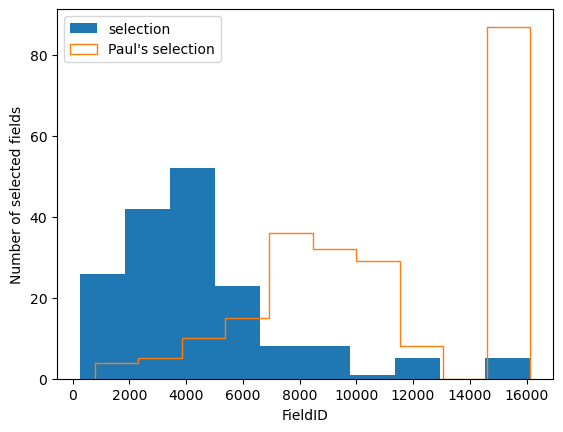

In [446]:
plt.hist(fields_south.loc[ind]['FieldID'], label='selection')
plt.hist(fields_south.loc[fields_south['BGLT_orig']]['FieldID'], label="Paul's selection",histtype='step')
plt.legend()
plt.xlabel('FieldID')
plt.ylabel("Number of selected fields")

C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\3579310084.py:5: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(mstar[i_orig]),bins=np.linspace(8,13,50),histtype='step',label="Paul's fields",color='C3',ls='--',lw=2)
C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\3579310084.py:15: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(sfrs[i_orig]),bins=np.linspace(-1.5,4,80),histtype='step',label="Paul's fields",color='C3',ls='--',lw=2)


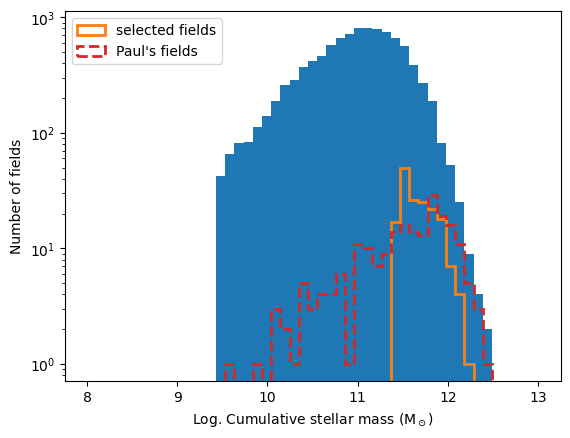

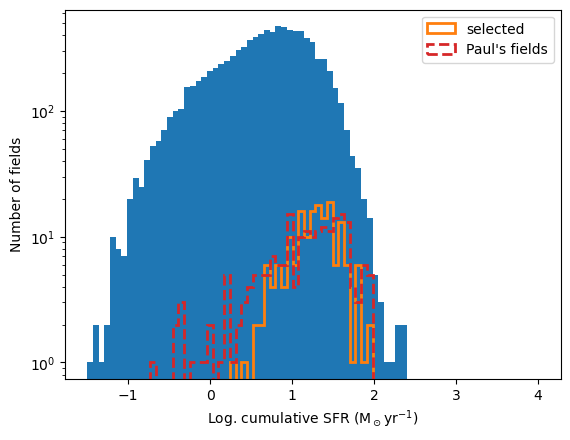

In [447]:
plt.figure()

plt.hist(np.log10(mstar[mstar>0]),bins=np.linspace(8,13,50))
plt.hist(np.log10(mstar[ind]),bins=np.linspace(8,13,50),histtype='step',label="selected fields",lw=2)
plt.hist(np.log10(mstar[i_orig]),bins=np.linspace(8,13,50),histtype='step',label="Paul's fields",color='C3',ls='--',lw=2)
plt.legend()
plt.ylabel("Number of fields")
plt.xlabel("Log. Cumulative stellar mass $\mathrm{(M_\odot)}$")
plt.gca().set_yscale('log')


plt.figure()
plt.hist(np.log10(sfrs[sfrs>0]),bins=np.linspace(-1.5,4,80))
plt.hist(np.log10(sfrs[ind]),bins=np.linspace(-1.5,4,80),histtype='step',label='selected',lw=2)
plt.hist(np.log10(sfrs[i_orig]),bins=np.linspace(-1.5,4,80),histtype='step',label="Paul's fields",color='C3',ls='--',lw=2)
#plt.axvline(np.log10(sfr_min),color='k',ls=':',label='threshold')
plt.legend()
plt.xlabel("Log. cumulative SFR ($\mathrm{M_\odot yr^{-1}}$)")
plt.ylabel("Number of fields")
plt.gca().set_yscale('log')

In [448]:
frac = np.sum(fields_south['ntns'].loc[fields_south['selected']])/np.sum(fields_south['ntns'])
print("selection covers %.2f percents of local transients"%(frac*100))

selection covers 20.65 percents of local transients


In [449]:
print(np.sum(np.logical_and(fields_south['selected'],fields_south['BGLT_orig'])),"fields in common with Paul's selection")

13 fields in common with Paul's selection


New selection ranked by cumulative SFR:

In [450]:
#fields_south.reset_index(drop=True,inplace=True)

In [451]:
#fields_south.iloc[np.argsort(np.array(fields_south['ntns']))[::-1]].loc[~np.isnan(fields_south['ntns'])]

In [452]:
np.sum(np.logical_or(mstar>=1e12,ngal>=16))

300

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0., 115.,  82.,  47.,  34.,  34.,  29.,  15.,
         13.,  13.,   7.,   6.,   1.,   3.]),
 array([0.        , 0.04487179, 0.08974359, 0.13461538, 0.17948718,
        0.22435897, 0.26923077, 0.31410256, 0.35897436, 0.40384615,
        0.44871795, 0.49358974, 0.53846154, 0.58333333, 0.62820513,
        0.67307692, 0.71794872, 0.76282051, 0.80769231, 0.8525641 ,
        0.8974359 , 0.94230769, 0.98717949, 1.03205128, 1.07692308,
        1.12179487, 1.16666667, 1.21153846, 1.25641026, 1.30128205,
        1.34615385, 1.39102564, 1.43589744, 1.48076923, 1.52564103,
        1.57051282, 1.61538462, 1.66025641, 1.70512821, 1.75      ]),
 <BarContainer object of 39 artists>)

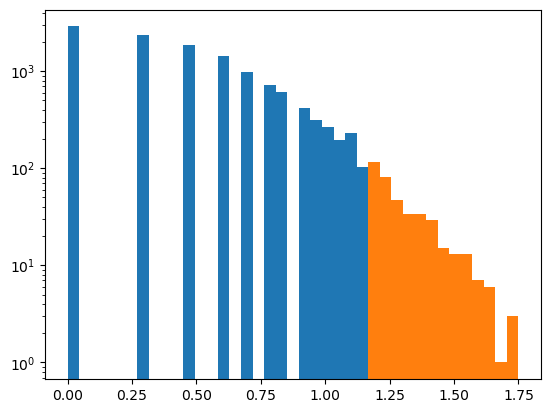

In [453]:
plt.hist(np.log10(fields_south['ngal']+1),bins=np.linspace(0,1.75,40))
plt.gca().set_yscale('log')
plt.hist(np.log10(fields_south['ngal'][fields_south['ngal']>13]+1),bins=np.linspace(0,1.75,40))


Old selection (ranked by cumulative stellar mass):

In [454]:
fields_south.iloc[np.argsort(fields_south['mtot_all'])[::-1]]

,FieldID,ra,dec,mtot_all,ntns,mtot,sfrtot,ngal,lum,BGLT_orig,selected
12311,12312,194.04878,27.25203,5.996886e+12,0.338981,2.449095e+12,74.377480,123,4.016542e-05,True,False
11243,11244,175.85254,19.38277,5.601029e+12,1.002620,2.190307e+12,93.129570,68,4.241901e-05,True,False
6426,6427,68.60986,-13.66814,5.039386e+12,0.622591,1.754278e+12,6.493516,71,8.128953e-06,True,False
9394,9395,78.94737,6.79195,4.327632e+12,0.737387,1.757065e+12,45.038792,52,1.327377e-05,True,False
12403,12404,355.60977,27.25203,4.202851e+12,0.338981,2.247611e+12,97.623825,54,1.773350e-05,False,False
...,...,...,...,...,...,...,...,...,...,...,...
6671,6672,102.40000,-12.09428,0.000000e+00,0.000000,0.000000e+00,0.000000,0,0.000000e+00,False,False
6675,6676,108.80000,-12.09428,0.000000e+00,0.000000,0.000000e+00,0.000000,0,0.000000e+00,False,False
6676,6677,110.40000,-12.09428,0.000000e+00,0.000000,0.000000e+00,0.000000,0,0.000000e+00,False,False
6677,6678,112.00000,-12.09428,0.000000e+00,0.000000,8.840968e+10,2.588213,1,9.289663e-08,False,False


Image of field with maximum sfr_tot:

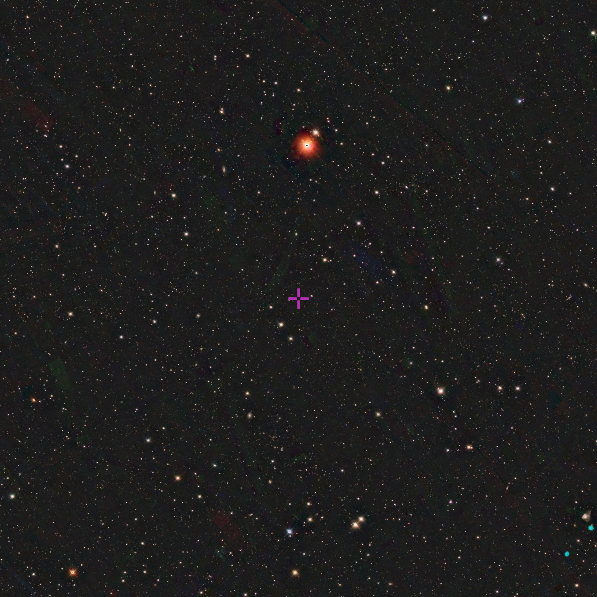

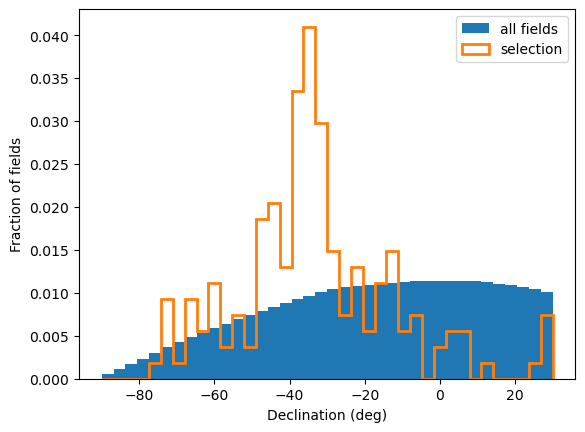

In [455]:
plt.hist(fields_south['dec'],bins=np.linspace(-90,30,39),density=True,label="all fields")
plt.hist(fields_south['dec'].loc[fields_south['selected']],bins=np.linspace(-90,30,39),histtype='step',lw=2,density=True,label="selection")
plt.ylabel("Fraction of fields")
plt.xlabel("Declination (deg)")
plt.legend()

## Get the images of the field of your choice and its galaxies

Retrieve a DSS image of the field and overlay approximate galaxy positions with circles.

5 TNS transients match this field
https://archive.stsci.edu/cgi-bin/dss_search?v=dss1&r=19.38461&d=-32.55437&e=J2000&h=100&w=100&f=gif
retrieved url
loaded image
(3531, 3531)
2024jck 18.9685175 -32.48125125 2516.0317082471233 1607.5613672099378
2023xbc 18.75605875 -33.01860625 2899.264969495819 2755.5908946699064
2023ueh 19.159322 -32.927574 2171.869351253659 2563.723736642679
2022aech 19.103042 -32.946719 2273.386092878413 2604.450540692574
2016gfk 18.526958 -32.657167 3312.487379463679 1979.2435078485007
ESO352-028 18.752906 -32.243487 2904.945018822137 1096.8495108097195
ESO352-030 18.974574 -32.477423 2505.1073016666137 1599.411335115985
ESO352-044 19.92274 -33.108706 794.8285749881657 2949.3014364448063
PGC073841 18.705853 -32.429139 2989.8113576482947 1493.6122632752479
PGC680179 19.883021 -33.1565 866.4700850140417 3051.9310072920207
ESO352-031 19.103625 -32.945056 2272.334459440567 2600.89453876794
PGC131933 19.814745 -33.013178 989.6310530757092 2745.768901099523
ESO352-026 18

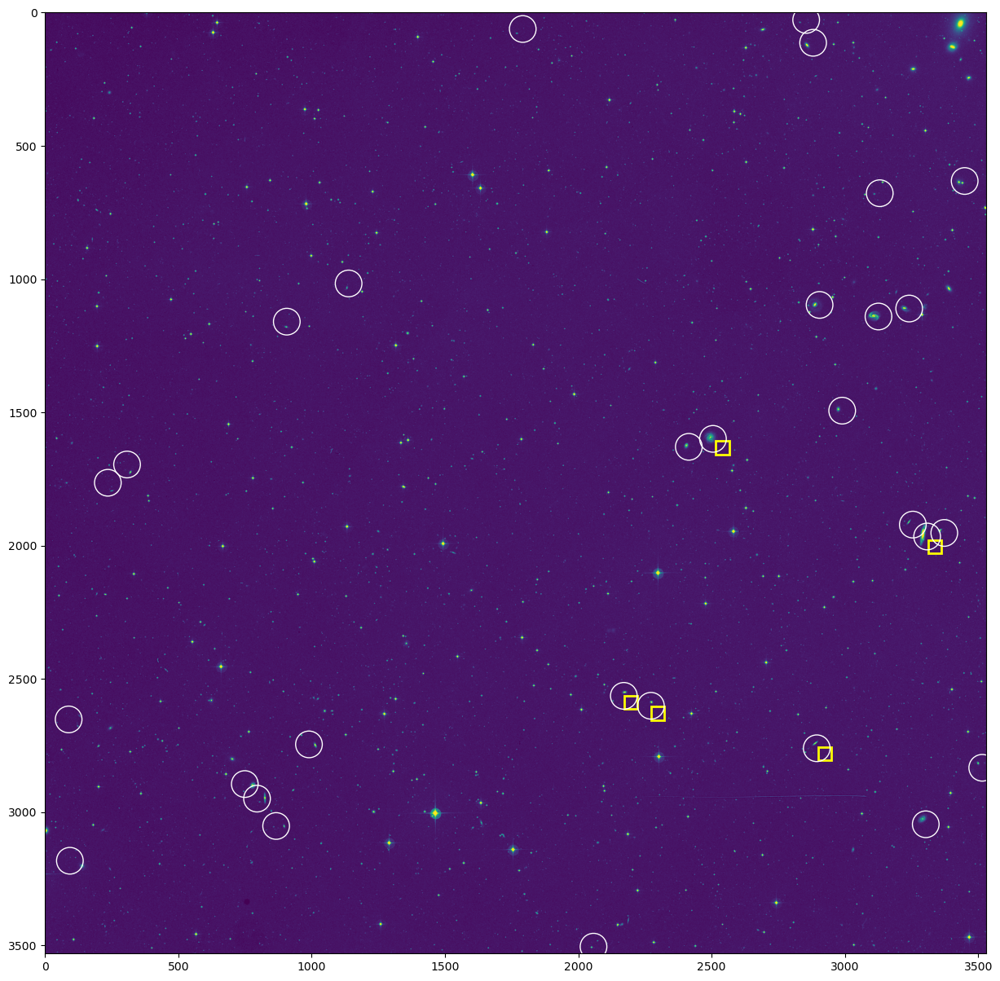

In [456]:

fieldid = 3876 #2607 #16013 #8663  #12312
fieldid = str(fieldid)

ifieldid = np.where(np.asarray(fields['FieldID'])==int(fieldid))[0][0]

Trans = [i for i in np.where(sep_constraint)[0] if idx[i]==ifieldid]
print(len(Trans),"TNS transients match this field")


raf, decf = np.asarray(fields.loc[fields['FieldID']==int(fieldid),['ra','dec']])[0]
coof = SkyCoord(raf,decf,unit='deg',frame='icrs')


#url = 'https://archive.stsci.edu/cgi-bin/dss_search?v=poss2ukstu_red&r=%s&d=%s&e=J2000&h=100&w=100&f=gif'%(raf,decf)
url = 'https://archive.stsci.edu/cgi-bin/dss_search?v=dss1&r=%s&d=%s&e=J2000&h=100&w=100&f=gif'%(raf,decf)
print(url)
cutout = requests.get(url, stream = True)
    
if cutout.status_code == 200:
    print("retrieved url")
    img = np.array(Image.open(cutout.raw))
    print("loaded image")
    print(img.shape)


fig, ax = plt.subplots(1, figsize=(15, 15))
ax.imshow(img)


from matplotlib.patches import Rectangle   
for j in Trans:
    trans = tns[j]
    ra, dec = trans['ra'], trans['declination']
    sep = SkyCoord(ra,dec,unit='deg',frame='icrs').separation(coof).deg
    pa = SkyCoord(ra,dec,unit='deg',frame='icrs').position_angle(coof).rad

    x = img.shape[0]/2+sep*scale*np.sin(pa)
    y = img.shape[1]/2+sep*scale*np.cos(pa)

    circ = Rectangle((x,y),50,50,ec="yellow",fc="None",lw=2)
    ax.add_patch(circ)
    print(trans['name'],ra,dec,x,y)


if fieldid in galids.keys():
    gals_in_field = gals[np.array(galids[fieldid]),]

    scale = img.shape[0]/1.65 # pix per deg



    #transients = tns[]


    for gal in gals_in_field:
        ra, dec = gal['ra'], gal['dec']
        sep = SkyCoord(ra,dec,unit='deg',frame='icrs').separation(coof).deg
        pa = SkyCoord(ra,dec,unit='deg',frame='icrs').position_angle(coof).rad

        x = img.shape[0]/2+sep*scale*np.sin(pa)
        y = img.shape[1]/2+sep*scale*np.cos(pa)

        circ = Circle((x,y),50,ec="w",fc="None")
        ax.add_patch(circ)
        print(gal['objname'],ra,dec,x,y)

else:
    print("No match with any galaxy in sample")



Display images of galaxies in field

ESO352-028
ESO352-030
ESO352-044
PGC073841
PGC680179
ESO352-031
PGC131933
ESO352-026
PGC694465
PGC697590
PGC701445
ESO352-027
PGC131934
PGC689951
ESO352-029
PGC004433
PGC142334
PGC004448
PGC004794
PGC100713
IC1657


C:\Users\hgtra\AppData\Local\Temp\ipykernel_9332\3181906340.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


PGC695411
PGC199439
PGC683038
PGC073928
PGC004514
PGC132858
PGC701627
PGC3174447
ESO352-025


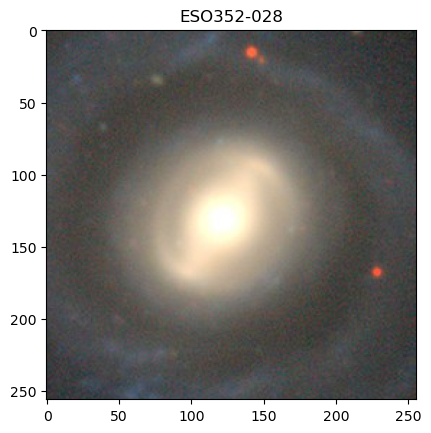

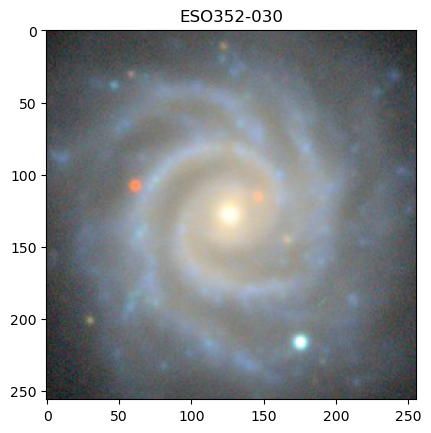

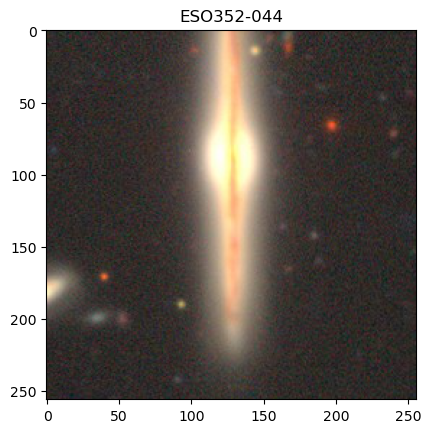

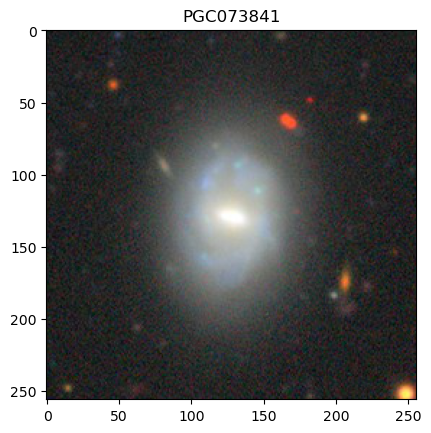

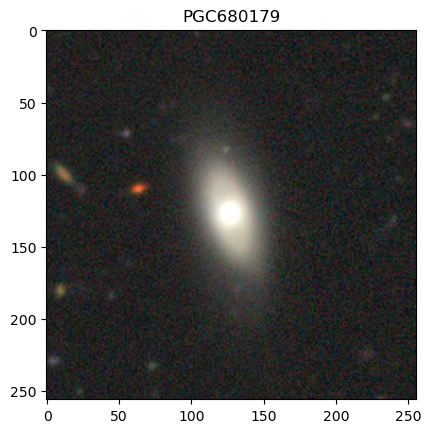

...

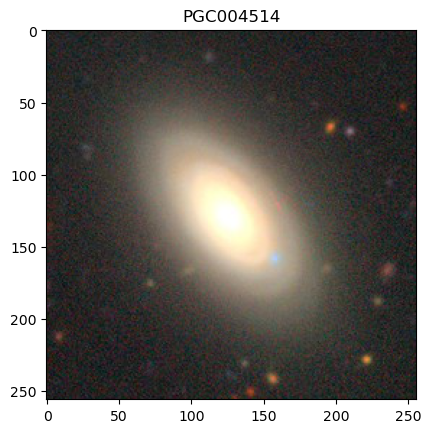

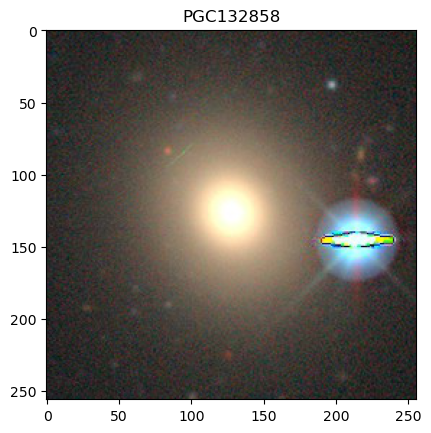

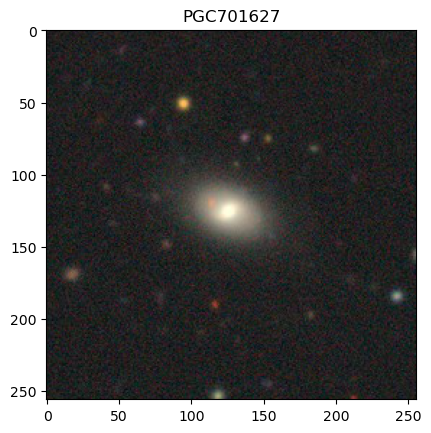

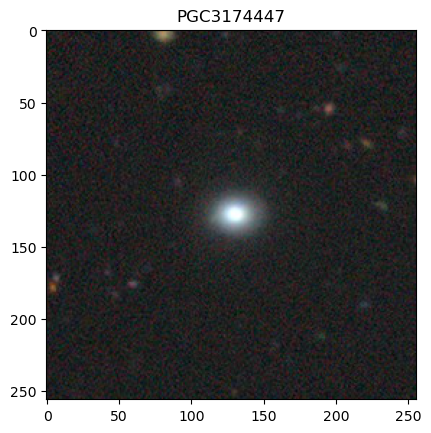

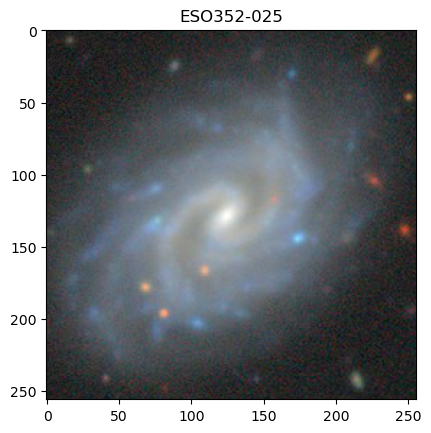

In [457]:

gals_in_field = gals[np.array(galids[fieldid]),]

for gal in gals_in_field:
    print(gal['objname'])
    ra, dec = gal['ra'], gal['dec']
    b = SkyCoord(ra,dec,unit='deg',frame='icrs').galactic.b.deg
    if dec>30 or abs(b)<20:
        print("galaxy not in Legacy Survey footprint")
        url = 'https://archive.stsci.edu/cgi-bin/dss_search?v=dss1&r=%s&d=%s&e=J2000&h=1&w=1&f=gif'%(ra,dec)
    else:
        url = 'https://www.legacysurvey.org/viewer/cutout.jpg?ra=%s&dec=%s&layer=ls-dr10-grz&zoom=14'%(ra,dec)
    
    cutout = requests.get(url, stream = True)
    
    if cutout.status_code == 200:
        plt.figure()
        img = np.array(Image.open(cutout.raw))
        plt.title(gal['objname'])
        plt.imshow(img)

Search for a galaxy around a position

In [458]:
ra, dec = 018.6302743961000, -32.26442525

gals_all[abs(gals_all['ra']-ra)+abs(gals_all['dec']-dec)<1e-3]

OBJNAME,ra,dec,R1,R2,PA,T,E_T,D,E_D,DMETHOD,BT,Babs,ML_RATIO,logSFR_HEC,FLAG_SFR_HEC,logM_HEC,METAL,FLAG_METAL,Mstar,sSFR
,deg,deg,arcmin,arcmin,deg,,,Mpc,Mpc,,mag,,,log(Msol/yr),,log(Msol),,,,
bytes30,float64,float64,float32,float32,float32,float32,float32,float64,float32,bytes2,float32,float64,float32,float32,bytes2,float32,float32,int16,float32,float32
ESO352-027,18.630375,-32.264472,0.684,0.533,89.9,5.1,0.4,113.763,22.5276,N,14.117,-21.163005554581495,--,0.38,F3,11.0404,--,-1,109748740000.0,2.1857497e-11
